# Main notebook for battery state estimation

In [1]:
import numpy as np
import pandas as pd
import scipy.io
import math
import os
import ntpath
import sys
import logging
import time
import sys
import tensorflow as tf
from tensorflow import keras
from tensorflow.keras import layers

from keras.models import Sequential
from keras.layers.core import Dense, Dropout, Activation
from keras.optimizers import SGD, Adam
from keras.utils import np_utils
from keras.layers import LSTM, Embedding, RepeatVector, TimeDistributed, Masking, Conv1D
from keras.callbacks import EarlyStopping, ModelCheckpoint, LambdaCallback

from importlib import reload
import plotly.graph_objects as go
import IPython
import IPython.display
import matplotlib.pyplot as plt
import seaborn as sns
import collections
from datetime import datetime, timedelta


    # data_path = "/content/drive/My Drive/Colab Notebooks/battery-state-estimation/battery-state-estimation/data/LG 18650HG2 Li-ion Battery Data/LG_HG2_Original_Dataset_McMasterUniversity_Jan_2020/"
data_path = r"C:\Users\Asus\Desktop\PG Project\Legend\vehicles\Code and Dataset\LG_HG2_Original_Dataset_McMasterUniversity_Jan_2020"


In [2]:
def get_files(data_path, drive_cycle_files, charge_cycle_files, temperature, get_discharge_only):
    
    # some LSTM training models require discharge cycles only
    if get_discharge_only:
        all_cycles = drive_cycle_files
    else:
        all_cycles = drive_cycle_files + charge_cycle_files

    # iterate thru each temperature folder and get drive cycle and corresponding charge files
    lg_csv_files = []
    folders = os.listdir(data_path)
    for folder in folders:
        d = os.path.join(data_path, folder)
        if os.path.isdir(d):
            for file in os.listdir(d):
                if file.endswith('.csv') and any(substring in file for substring in all_cycles):
                    lg_csv_files.append(data_path +'/'+ folder + '/' + file)
     
    # get the first valid index in each file and add it to the 'files' dictionary
    files = {}
    for csv_file in lg_csv_files:
        if any('/'+ substring in csv_file for substring in temperature):
            df = pd.read_csv(csv_file, header=[25,26], index_col=0, parse_dates=True,nrows=26)
            files[str(df.first_valid_index())] = csv_file
    
    # sort the dictionary by time index
    od = collections.OrderedDict(sorted(files.items()))
    filtered = od.copy()

    # the ordered dictionary can have unnecessary charge files, pop them out 
    # incorrect sequence can have - charge, charge, discharge, charge
    # with this section the file sequence will look like - discharge, charge, discharge..
    if not get_discharge_only:
    
        is_previous_charge = False
        is_previous_discharge = False
    
        for key, value in od.items():
            if not is_previous_discharge and any(substring in value for substring in drive_cycle_files):
                is_previous_discharge = True 
                is_previous_charge = False
            elif not is_previous_charge and any(substring in value for substring in charge_cycle_files):
                if not is_previous_charge and not is_previous_discharge:
                    filtered.pop(key)
                is_previous_charge = True
                is_previous_discharge = False
            elif is_previous_discharge and any(substring in value for substring in drive_cycle_files):
                filtered.pop(key)
            elif is_previous_charge and any(substring in value for substring in charge_cycle_files):
                filtered.pop(key)
            
    return list(filtered.values())

In [3]:
def create_dataset(file_paths, drive_cycle_files, charge_cycle_files, vi_averages = False, resample_1hz = False):
    
    for path in file_paths:
        cycle = pd.read_csv(path, header=[25,26], index_col=0, parse_dates=True)
        
        #drop second row in the header
        cycle.columns = cycle.columns.droplevel(1) 
        
        # leave out 'PAU' rows from the cycle
        options = ['CHA', 'DCH', 'TABLE']
        cycle = cycle[cycle['Status'].isin(options)]

        # calculate 'Power'
        cycle['Power'] = cycle['Voltage'] * cycle['Current']
        
        # calculate SOC Percentage + downsample discharge cycles, upsample charge cycles
        # - DISCHARGE FILES
        if any(substring in path for substring in drive_cycle_files):
            max_discharge = abs(min(cycle['Capacity']))
            cycle['SoC Percentage'] = (cycle['Capacity'] + max_discharge)/max_discharge

            if resample_1hz:
                cycle = cycle.resample('1S').first()

        # - CHARGE FILES
        elif any(substring in path for substring in charge_cycle_files):
            max_charge = abs(max(cycle['Capacity']))
            cycle['SoC Percentage'] = (cycle['Capacity'])/max_charge

            if resample_1hz:
                cycle = cycle[~cycle.index.duplicated(keep='first')]
                cycle = cycle.resample('1S').ffill()

        # select required features
        parameters = cycle[['Voltage', 'Current', 'Temperature', 'Power', 'SoC Percentage']].copy()

        # calculate 'Voltage', 'Current' and 'Power' averages
        # 500 second rolling window which translates to rougly 500 data points for resampled data and 5000 for raw data
        rolling_window = 5000
        if vi_averages and resample_1hz:
          rolling_window = int(rolling_window / 10)

        if vi_averages:
          parameters['Voltage Average'] = parameters['Voltage'].rolling(rolling_window).mean()
          parameters['Current Average'] = parameters['Current'].rolling(rolling_window).mean()
          parameters['Power Average'] = parameters['Power'].rolling(rolling_window).mean()
        
        # drop rows with NaN or empty values in them, reset the index to reflect
        parameters.dropna(inplace=True)
        parameters.reset_index(drop=True, inplace=True)
        
        # merge datasets
        try:
            merged = pd.concat([merged, parameters], ignore_index=True)
        except:
            merged = parameters.copy()

    # scale (normalize) the dataset using mean normalization
    merged_norm = (merged-merged.mean())/merged.std()
    # min-max normalization
    # merged_norm = (merged - merged.min())/(merged.max() - merged.min())
    return merged, merged_norm

In [4]:
charge_cycle_files = ['Charge']

# provide temperatures and drive cyclces to use for the training and test datasets
# available temperatures (n for negative) - n20degC, n10degC, 0degC, 10degC, 25degC, 40degC
# available drive cycles - UDDS, HWFET, LA92, US06, Mixed ('mixed' tests drive cycles randomly)
train_temps = ['n10degC', '0degC', '10degC', '25degC']
train_drive_cycles = ['Mixed']

test_temps = ['n10degC', '0degC', '10degC', '25degC']
test_drive_cycles = ['UDDS', 'HWFET', 'LA92', 'US06']

# set 'get_discharge_only' to True to get dischrage cycles only
# set 'get_discharge_only' to False to get correponding charge cycles also
get_discharge_only = False

# set 'resample' to True to downsample discharge cycles (originally < 1Hz) to 1Hz, upsample charge cycles (originally 1 min) to 1Hz
# if including charge cycle, always set resample to True
resample_1hz = True

# set 'vi_averages' to True only if training a model with only Dense layers (DNN), set to False is training LSTM layers
vi_averages = True 

# get files in order of battery experiment time
train_files = get_files(data_path, 
                        train_drive_cycles, 
                        charge_cycle_files, 
                        train_temps, 
                        get_discharge_only)

test_files = get_files(data_path, 
                       test_drive_cycles, 
                       charge_cycle_files, 
                       test_temps, 
                       get_discharge_only)

# 'create_dataset' concatenates files into a dataframe and does pre-processing
train, train_norm = create_dataset(train_files, 
                                   train_drive_cycles, 
                                   charge_cycle_files,
                                   vi_averages, 
                                   resample_1hz)

test, test_norm = create_dataset(test_files, 
                                 test_drive_cycles, 
                                 charge_cycle_files,
                                 vi_averages,
                                 resample_1hz)

In [5]:
train_norm.describe().transpose()
print(train_norm.shape)
print(train_norm.head())

(305032, 8)
Time Stamp   Voltage   Current  Temperature     Power  SoC Percentage  \
0           0.872001 -0.039086     0.716072 -0.092679        1.245405   
1           0.852417 -0.150839     0.716072 -0.219374        1.245288   
2           0.830123 -0.266581     0.716072 -0.350145        1.245080   
3           0.795311 -0.447181     0.716072 -0.553313        1.244728   
4           0.842642 -0.159816     0.716072 -0.229400        1.244389   

Time Stamp  Voltage Average  Current Average  Power Average  
0                  0.999538        -0.295851      -0.375059  
1                  0.999022        -0.296320      -0.375572  
2                  0.998465        -0.297075      -0.376394  
3                  0.997831        -0.298342      -0.377771  
4                  0.997304        -0.298786      -0.378254  


In [6]:
train_features = train_norm.copy()  #Train_x
test_features = test_norm.copy()     #Test_x

train_labels = train_features.pop('SoC Percentage')  #Train_y
test_labels = test_features.pop('SoC Percentage')    #test_y

In [7]:
train_features.describe()
print(train_labels.shape)
print(train_features.head())

(305032,)
Time Stamp   Voltage   Current  Temperature     Power  Voltage Average  \
0           0.872001 -0.039086     0.716072 -0.092679         0.999538   
1           0.852417 -0.150839     0.716072 -0.219374         0.999022   
2           0.830123 -0.266581     0.716072 -0.350145         0.998465   
3           0.795311 -0.447181     0.716072 -0.553313         0.997831   
4           0.842642 -0.159816     0.716072 -0.229400         0.997304   

Time Stamp  Current Average  Power Average  
0                 -0.295851      -0.375059  
1                 -0.296320      -0.375572  
2                 -0.297075      -0.376394  
3                 -0.298342      -0.377771  
4                 -0.298786      -0.378254  


In [8]:
from numpy import reshape, array

train_array = array(train_features)
labels_array = array(train_labels)

sample_size = train_features.shape[0]
time_steps = train_features.shape[1]
input_dimension = 1

train_reshaped = train_array.reshape((sample_size,time_steps,1))
labels_reshaped = labels_array.reshape((train_labels.shape[0],1,1))

print(train_reshaped.shape)
print(labels_reshaped.shape)

(305032, 7, 1)
(305032, 1, 1)


In [9]:
# CNN Model
#activation fn relu, sigmoid
cnn_model = Sequential()
cnn_model.add(Conv1D(filters=32,
                           kernel_size=(7,),
                           activation='relu'))
cnn_model.add(Dense(32, activation='relu'))
cnn_model.add(Dense(1))
0
cnn_model.compile(optimizer=tf.keras.optimizers.SGD(learning_rate=0.001), loss='mean_absolute_error')


In [10]:
history = cnn_model.fit(train_reshaped, train_labels, 
                                epochs=25, 
                                batch_size=32, 
                                verbose=1,
                                validation_split=0.2,
                               )

Epoch 1/25
7626/7626 [==============================] - 17s 2ms/step - loss: 0.1746 - val_loss: 0.1197
Epoch 2/25
7626/7626 [==============================] - 16s 2ms/step - loss: 0.0495 - val_loss: 0.1061
Epoch 3/25
7626/7626 [==============================] - 17s 2ms/step - loss: 0.0442 - val_loss: 0.0989
Epoch 4/25
7626/7626 [==============================] - 16s 2ms/step - loss: 0.0418 - val_loss: 0.0988
Epoch 5/25
7626/7626 [==============================] - 16s 2ms/step - loss: 0.0400 - val_loss: 0.0935
Epoch 6/25
7626/7626 [==============================] - 16s 2ms/step - loss: 0.0385 - val_loss: 0.0929
Epoch 7/25
7626/7626 [==============================] - 17s 2ms/step - loss: 0.0375 - val_loss: 0.0920
Epoch 8/25
7626/7626 [==============================] - 16s 2ms/step - loss: 0.0368 - val_loss: 0.0865
Epoch 9/25
7626/7626 [==============================] - 17s 2ms/step - loss: 0.0362 - val_loss: 0.0864
Epoch 10/25
7626/7626 [==============================] - 17s 2ms/step - l

In [11]:
hist = pd.DataFrame(history.history)
hist['epoch'] = history.epoch
hist.tail()

,loss,val_loss,epoch
20,0.031633,0.080280,20
21,0.031428,0.077495,21
22,0.031228,0.082989,22
23,0.031041,0.081518,23
24,0.030863,0.080501,24


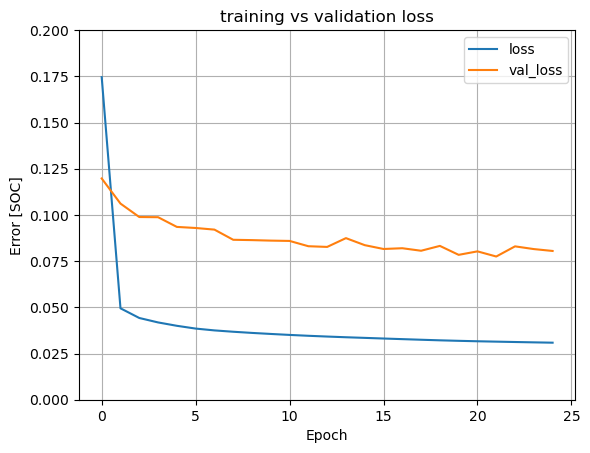

In [12]:
def plot_loss(history):
  plt.plot(history.history['loss'], label='loss')
  plt.plot(history.history['val_loss'], label='val_loss')
  plt.ylim([0, 0.2])
  plt.xlabel('Epoch')
  plt.ylabel('Error [SOC]')
  plt.title('training vs validation loss')
  plt.legend()
  plt.grid(True)
plot_loss(history)
plt.savefig(r"C:\Users\Asus\Desktop\PG Project\Legend\vehicles\Clg project files\Phase 1\Output\abc3.png", dpi=600)

In [13]:
test_results = {}
test_results['cnn_model'] = cnn_model.evaluate(test_features, test_labels, verbose=2)

4903/4903 - 8s - loss: 0.0476 - 8s/epoch - 2ms/step


In [14]:
pd.DataFrame(test_results, index=['Mean Abosolute Error (MAE)']).T

,Mean Abosolute Error (MAE)
cnn_model,0.04757


4903/4903 [==============================] - 9s 2ms/step


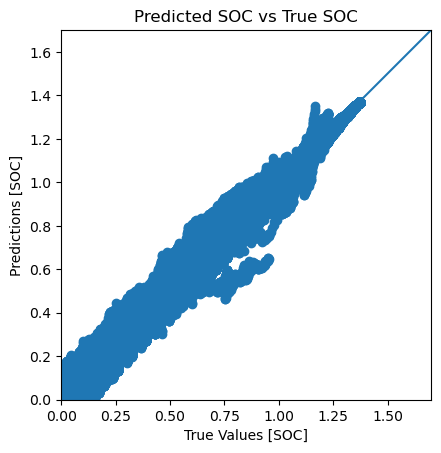

In [15]:
test_predictions = cnn_model.predict(test_features).flatten()

a = plt.axes(aspect='equal')
plt.scatter(test_labels, test_predictions)
plt.xlabel('True Values [SOC]')
plt.ylabel('Predictions [SOC]')
lims = [0, 1.7]
plt.xlim(lims)
plt.ylim(lims)
plt.title('Predicted SOC vs True SOC')
_ = plt.plot(lims, lims)
plt.savefig(r"C:\Users\Asus\Desktop\PG Project\Legend\vehicles\Clg project files\Phase 1\Output\abc4.png", dpi=600)

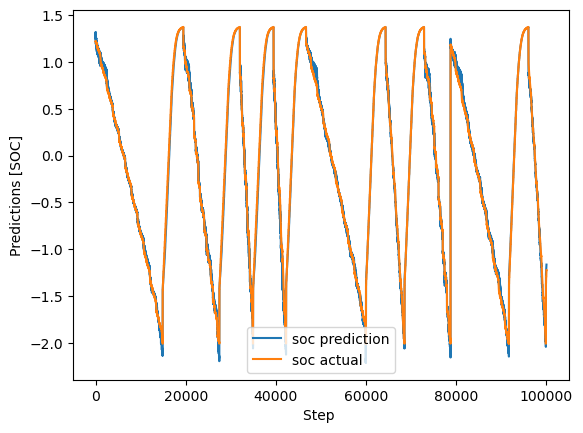

In [16]:
plt.xlabel('Step ')
plt.ylabel('Predictions [SOC]')
plt.plot(test_predictions[:100000], label='soc prediction')
plt.plot(test_labels[:100000], label='soc actual')
plt.legend()
plt.savefig(r"C:\Users\Asus\Desktop\PG Project\Legend\vehicles\Clg project files\Phase 1\Output\abc5.png", dpi=600)

In [17]:
import plotly.graph_objects as go

cycle_num = 0
steps_num = 50000
step_index = np.arange(cycle_num*steps_num, (cycle_num+1)*steps_num)

fig = go.Figure()
fig.add_trace(go.Scatter(x=step_index, y=test_predictions[cycle_num*steps_num:(cycle_num+1)*steps_num],
                    mode='lines', name='SoC predicted'))
fig.add_trace(go.Scatter(x=step_index, y=test_labels[cycle_num*steps_num:(cycle_num+1)*steps_num],
                    mode='lines', name='SoC actual'))
fig.update_layout(title='Results on testing',
                  xaxis_title='Step',
                  yaxis_title='SoC percentage')
#fig.savefig(r"C:\Users\Asus\Desktop\abc5.png")
fig.show()

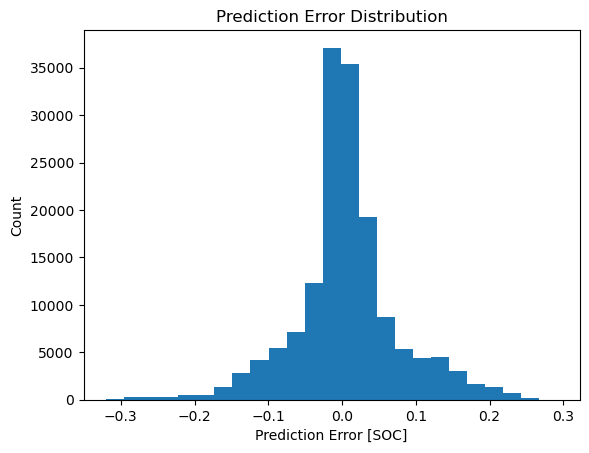

In [17]:
error = test_predictions - test_labels
plt.hist(error, bins=25)
plt.xlabel('Prediction Error [SOC]')
plt.title('Prediction Error Distribution')
_ = plt.ylabel('Count')
plt.savefig(r"C:\Users\Asus\Desktop\PG Project\Legend\vehicles\Clg project files\Phase 1\Output\abc6.png", dpi=600)

In [49]:
cnn_model.save('cnn_model')

reloaded = tf.keras.models.load_model('cnn_model')

test_results['reloaded'] = reloaded.evaluate(
    test_features, test_labels, verbose=0)

pd.DataFrame(test_results, index=['Mean absolute error [SOC]']).T

INFO:tensorflow:Assets written to: cnn_model\assets


INFO:tensorflow:Assets written to: cnn_model\assets


,Mean absolute error [SOC]
cnn_model,0.049178
reloaded,0.049178


In [49]:
from sklearn.metrics import r2_score, mean_squared_error

cnn_model.compile(optimizer='adam', loss='categorical_crossentropy', metrics=['accuracy', tf.keras.metrics.RootMeanSquaredError(), tf.keras.metrics.MeanSquaredError()])


In [19]:
test_loss, test_acc, test_rmse, test_mse = cnn_model.evaluate(test_features, test_labels, verbose=2)

print('Test accuracy:', test_acc)
print('Test loss:', test_loss)
print('Test RMSE:', test_rmse)
print('Test MSE:', test_mse)


4903/4903 - 8s - loss: 0.0491 - 8s/epoch - 2ms/step


TypeError: cannot unpack non-iterable float object